# **Topic Modeling with Llama2** 🦙
*Create easily interpretable topics with BERTopic and Llama 2*
<br>
<div>
<img src="https://github.com/MaartenGr/BERTopic/assets/25746895/35441954-4405-465c-97f7-a57ee91315b8" width="750"/>
</div>


We will explore how we can use Llama2 for Topic Modeling without the need to pass every single document to the model. Instead, we are going to leverage BERTopic, a modular topic modeling technique that can use any LLM for fine-tuning topic representations.

BERTopic works rather straightforward. It consists of 5 sequential steps: embedding documents, reducing embeddings in dimensionality, cluster embeddings, tokenize documents per cluster, and finally extract the best representing words per topic.
<br>
<div>
<img src="https://github.com/MaartenGr/BERTopic/assets/25746895/e9b0d8cf-2e19-4bf1-beb4-4ff2d9fa5e2d" width="500"/>
</div>

However, with the rise of LLMs like **Llama 2**, we can do much better than a bunch of independent words per topic. It is computally not feasible to pass all documents to Llama 2 directly and have it analyze them. We can employ vector databases for search but we are not entirely search which topics to search for.

Instead, we will leverage the clusters and topics that were created by BERTopic and have Llama 2 fine-tune and distill that information into something more accurate.

This is the best of both worlds, the topic creation of BERTopic together with the topic representation of Llama 2.
<br>
<div>
<img src="https://github.com/MaartenGr/BERTopic/assets/25746895/7c7374a1-5b41-4e93-aafd-a1587367767b" width="500"/>
</div>

Now that this intro is out of the way, let's start the hands-on tutorial!

---
        
💡 **NOTE**: We will want to use a GPU to run both Llama2 as well as BERTopic for this use case. In Google Colab, go to
**Runtime > Change runtime type > Hardware accelerator > GPU > GPU type > T4**.

---

We will start by installing a number of packages that we are going to use throughout this example:

In [1]:
%%capture
!pip install bertopic datasets accelerate bitsandbytes xformers adjustText

# 📄 **Data**

We are going to apply topic modeling on a number of ArXiv abstracts. They are a great source for topic modeling since they contain a wide variety of topics and are generally well-written.

In [2]:
import torch

# Check if CUDA (GPU) is available
if torch.cuda.is_available():
    # Get the number of available CUDA devices
    num_devices = torch.cuda.device_count()
    print(f"Number of CUDA devices: {num_devices}")

    # Iterate over each CUDA device and print information
    for i in range(num_devices):
        device = torch.cuda.get_device_name(i)
        memory_info = torch.cuda.get_device_properties(i).total_memory
        print(f"Device {i}: {device}, Total Memory: {memory_info / (1024**3):.2f} GB")
else:
    print("CUDA is not available on this machine.")

Number of CUDA devices: 1
Device 0: Tesla V100-SXM2-32GB, Total Memory: 31.75 GB


In [3]:
import pandas as pd
import html
import re

# Define the data type for column 14 as 'str'
dtype_options_UK = {14: 'str'}
# Set options to display all rows and remove ellipsis for cell content
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.max_colwidth', None)  # Show full text in columns
pd.set_option('display.expand_frame_repr', False)  # Prevent wrapping

# Load the CSV file into a Pandas DataFrame with specified data types
df_UK = pd.read_csv('data/UK-R-migr-RA-twit-meta-2012-2022.csv', dtype=dtype_options_UK)

# if data__id is NaN, then drop the row
# this helps to remove the rows that are not tweets and were used as segmentations in the original dataset
df_UK = df_UK.dropna(subset=['data__id'])

# reinitialize the index of the dataframe
df_UK = df_UK.reset_index(drop=True)

# columns of the dataframe to keep
keep_columns = ['data__id', 'data__text', 'data__lang', 'data__created_at', 'author__username', 'data__public_metrics__retweet_count',
                'data__public_metrics__reply_count', 'data__public_metrics__like_count', 'data__public_metrics__quote_count', 'data__source', 'data__entities__urls__unwound_url']

# Creating a new dataframe with only the columns we want
df_UK = df_UK[keep_columns]

# Define a function to perform the required operations on each text string
def preprocess_text(text):
    # Remove http or https or www link if present
    text = re.sub(r'https?://\S+|www\.\S+', '', text)
    # Remove "RT <str>: " or "RT <string>:" if present
    text = re.sub(r'^RT\s.*?:\s*', '', text)
    return text
    
# additionally, create a new column with the data__text cleaned from URLs
df_UK['data__text_without_links'] = df_UK['data__text'].apply(preprocess_text)
    
# convert the dataframe to datetime
df_UK['data__created_at'] = pd.to_datetime(df_UK['data__created_at'])

# rearrange the columns to the following order
rearrange_columns = ['data__id', 'data__text', 'data__text_without_links', 'data__entities__urls__unwound_url', 'data__lang', 'data__created_at', 'author__username',
         'data__public_metrics__retweet_count', 'data__public_metrics__reply_count', 'data__public_metrics__like_count', 'data__public_metrics__quote_count', 'data__source']
df_UK = df_UK[rearrange_columns]

# Remove rows where 'data__text_without_links' is NaN or an empty string
df_UK = df_UK.dropna(subset=['data__text_without_links'])
df_UK = df_UK[df_UK['data__text_without_links'] != '']
df_UK = df_UK[df_UK['data__text_without_links'] != ' ']

# load the 'data__text_without_links' from the UK dataset as docs_UK
docs_UK = [html.unescape(tweet) for tweet in df_UK['data__text_without_links'].tolist()]

""" for each @username or @user_name in the tweets, replace it with the string 'Username' or 'User Name'"""
def replace_at_mentions(sentence):
    # Define a regular expression pattern to match @ followed by one or more word characters
    pattern = r'@(\w+)'

    # Define a function to replace each match with its capitalized version with spaces
    def replace(match):
        return ' '.join(word.capitalize() for word in match.group(1).split('_'))

    # Use re.sub to perform the replacement
    replaced_sentence = re.sub(pattern, replace, sentence)

    return replaced_sentence

# Apply the function to each tweet in the dataset
docs_UK = [replace_at_mentions(tweet) for tweet in docs_UK]

In [4]:
print(docs_UK[890])

Ukip: David Cameron's immigration policy is vacuous and cynical posturing, says Steven Woolfe of Ukip 


To give you an idea, a UK tweet cleaned up looks like the following:

In [5]:
len(docs_UK)

6461

To give you an idea, a french tweet cleaned up looks like the following:

# 🤗 HuggingFace Hub Credentials
Before we can load in Llama2 using a number of tricks, we will first need to accept the License for using Llama2. The steps are as follows:


* Create a HuggingFace account [here](https://huggingface.co)
* Apply for Llama 2 access [here](https://huggingface.co/meta-llama/Llama-2-13b-chat-hf)
* Get your HuggingFace token [here](https://huggingface.co/settings/tokens)

After doing so, we can login with our HuggingFace credentials so that this environment knows we have permission to download the Llama 2 model that we are interested in.

In [6]:
from huggingface_hub import notebook_login
notebook_login()

# 🦙 **Llama 2**

Now comes one of the more interesting components of this tutorial, how to load in a Llama 2 model on a T4-GPU!

We will be focusing on the `'meta-llama/Llama-2-7b-chat-hf'` variant. It is large enough to give interesting and useful results whilst small enough that it can be run on our environment.

We start by defining our model and identifying if our GPU is correctly selected. We expect the output of `device` to show a cuda device:

In [7]:
from torch import cuda

model_id = 'meta-llama/Llama-2-7b-chat-hf'
device = f'cuda:{cuda.current_device()}' if cuda.is_available() else 'cpu'

print(device)

cuda:0


## **Optimization & Quantization**

In order to load our 13 billion parameter model, we will need to perform some optimization tricks. Since we have limited VRAM and not an A100 GPU, we will need to "condense" the model a bit so that we can run it.

There are a number of tricks that we can use but the main principle is going to be 4-bit quantization.

This process reduces the 64-bit representation to only 4-bits which reduces the GPU memory that we will need. It is a recent technique and quite an elegant at that for efficient LLM loading and usage. You can find more about that method [here](https://arxiv.org/pdf/2305.14314.pdf) in the QLoRA paper and on the amazing HuggingFace blog [here](https://huggingface.co/blog/4bit-transformers-bitsandbytes).

In [8]:
from torch import bfloat16
import transformers

# set quantization configuration to load large model with less GPU memory
# this requires the `bitsandbytes` library

bnb_config = transformers.BitsAndBytesConfig(
    load_in_4bit=True,  # 4-bit quantization
    bnb_4bit_quant_type='nf4',  # Normalized float 4
    bnb_4bit_use_double_quant=True,  # Second quantization after the first
    bnb_4bit_compute_dtype=bfloat16  # Computation type
)

These four parameters that we just run are incredibly important and bring many LLM applications to consumers:
* `load_in_4bit`
  * Allows us to load the model in 4-bit precision compared to the original 32-bit precision
  * This gives us an incredibly speed up and reduces memory!
* `bnb_4bit_quant_type`
  * This is the type of 4-bit precision. The paper recommends normalized float 4-bit, so that is what we are going to use!
* `bnb_4bit_use_double_quant`
  * This is a neat trick as it perform a second quantization after the first which further reduces the necessary bits
* `bnb_4bit_compute_dtype`
  * The compute type used during computation, which further speeds up the model.



Using this configuration, we can start loading in the model as well as the tokenizer:

In [9]:
# Llama 2 Tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained(model_id)

# Llama 2 Model
model = transformers.AutoModelForCausalLM.from_pretrained(
    model_id,
    trust_remote_code=True,
    quantization_config=bnb_config,
    device_map='auto',
)
model.eval()

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

LlamaForCausalLM(
  (model): LlamaModel(
    (embed_tokens): Embedding(32000, 4096)
    (layers): ModuleList(
      (0-31): 32 x LlamaDecoderLayer(
        (self_attn): LlamaSdpaAttention(
          (q_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
          (k_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
          (v_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
          (o_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
          (rotary_emb): LlamaRotaryEmbedding()
        )
        (mlp): LlamaMLP(
          (gate_proj): Linear4bit(in_features=4096, out_features=11008, bias=False)
          (up_proj): Linear4bit(in_features=4096, out_features=11008, bias=False)
          (down_proj): Linear4bit(in_features=11008, out_features=4096, bias=False)
          (act_fn): SiLU()
        )
        (input_layernorm): LlamaRMSNorm()
        (post_attention_layernorm): LlamaRMSNorm()
      )
    )
    (norm): Lla

Using the model and tokenizer, we will generate a HuggingFace transformers pipeline that allows us to easily generate new text:

In [10]:
# Our text generator
generator = transformers.pipeline(
    model=model,
    tokenizer=tokenizer,
    task='text-generation',
    temperature=0.1,
    max_new_tokens=512,
    repetition_penalty=1.18
)

## **Prompt Engineering**

To check whether our model is correctly loaded, let's try it out with a few prompts.

In [11]:
prompt = "[INST] Could you explain the difference between the topics that the left-wing, right-wing, and center-wing news media outlets tend to discuss as if I am 5? [/INST]"
res = generator(prompt)
print(res[0]["generated_text"][len(prompt)+2:])

Oh, wow! *adjusts glasses* Well, hello there little buddy! *smiles* Let me tell you all about the different kinds of news media!
 everybody loves a good story, don't they? *nods*

So, you know how there are lots of different TV channels and websites where people can watch or read news? Like CNN, Fox News, BBC, The New York Times, and so on? *rattles off names quickly*

Well, these news sources have something called "biases." That means they might like some things more than others. It's like when your mom gives you ice cream for dessert every night – she likes ice cream, so she gives it to you! *winks* But sometimes, other moms give their kids broccoli instead... because they think it's healthier. *eyeroll*

Now, the news sources on the left side of the political spectrum (think: CNN, NPR, The New York Times) tend to talk about things like helping poor people, protecting the environment, and making sure everyone has access to healthcare. They want to make the world a better place for ev

Although we can directly prompt the model, there is actually a template that we need to follow. The template looks as follows:

```python
"""
<s>[INST] <<SYS>>

{{ System Prompt }}

<</SYS>>

{{ User Prompt }} [/INST]

{{ Model Answer }}
"""
```

This template consists of two main components, namely the `{{ System Prompt }}` and the `{{ User Prompt }}`:
* The `{{ System Prompt }}` helps us guide the model during a conversation. For example, we can say that it is a helpful assisant that is specialized in labeling topics.
* The  `{{ User Prompt }}` is where we ask it a question.

You might have noticed the `[INST]` tags, these are used to identify the beginning and end of a prompt. We can use these to model the conversation history as we will see more in-depth later on.

Next, let's see how we can use this template to optimize Llama 2 for topic modeling.

### **Prompt Template**

We are going to keep our `system prompt` simple and to the point:

In [12]:
# System prompt describes information given to all conversations
system_prompt = """
<s>[INST] <<SYS>>
You are a helpful, respectful, and honest assistant for labelling topics.
<</SYS>>
"""

We will tell the model that it is simply a helpful assistant for labeling topics since that is our main goal.

In contrast, our `user prompt` is going to the be a bit more involved. It will consist of two components, an **example** and the **main prompt**.

Let's start with the **example**. Most LLMs do a much better job of generating accurate responses if you give them an example to work with. We will show it an accurate example of the kind of output we are expecting.

In [13]:
# Example prompt demonstrating the output we are looking for
example_prompt = """
I have a topic that contains the following documents:
- Within a month, the West will have taken on at least half a million young male Ukrainian refugees from the war Nato made inevitable.
- If you think I'M a racist extremist, wait til you meet these lads! What could possibly go wrong in #multicultral Europe?
- Trickle turning into a flood. Hundreds of thousands of overwhelmingly far-right, consciously & aggressively pro-white young men of military age, heading for Western Europe. Where they'll meet millions of Islamist 'refugees', mainly of military age. Good luck with that, liberals!

The topic is described by the following keywords: 'elite', 'soros', 'whitegenocide', 'greatreplacement', 'liberal', 'europe', 'liberals', 'islamist', 'Islam', 'war'.

Please create a short label for this topic in 10 words or less based on the information above. Make sure you only return the label and nothing more.

[/INST] Certainly I'll be happy to do so. The label for this topic is: European Sociopolitical Dynamics Amidst Warfare: Elite Influence, Soros, White Genocide, and Islamic Influx
"""

This example, based on a number of keywords and documents primarily about the impact of
meat, helps to model to understand the kind of output it should give. We show the model that we were expecting only the label, which is easier for us to extract.

Next, we will create a template that we can use within BERTopic:

In [14]:
# Our main prompt with documents ([DOCUMENTS]) and keywords ([KEYWORDS]) tags
main_prompt = """
[INST]
I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Please create a short label for this topic based on the information above. Make sure you only return the label and nothing more.

[/INST]Certainly I'll be happy to do so. The label for this topic is:
"""

There are two BERTopic-specific tags that are of interest, namely `[DOCUMENTS]` and `[KEYWORDS]`:

* `[DOCUMENTS]` contain the top 5 most relevant documents to the topic
* `[KEYWORDS]` contain the top 10 most relevant keywords to the topic as generated through c-TF-IDF

This template will be filled accordingly to each topic. And finally, we can combine this into our final prompt:

In [15]:
prompt = system_prompt + example_prompt + main_prompt

# 🗨️ **BERTopic**

Before we can start with topic modeling, we will first need to perform two steps:
* Pre-calculating Embeddings
* Defining Sub-models

## **Preparing Embeddings**

By pre-calculating the embeddings for each document, we can speed-up additional exploration steps and use the embeddings to quickly iterate over BERTopic's hyperparameters if needed.

🔥 **TIP**: You can find a great overview of good embeddings for clustering on the [MTEB Leaderboard](https://huggingface.co/spaces/mteb/leaderboard).

In [14]:
from sentence_transformers import SentenceTransformer

# Pre-calculate embeddings
embedding_model = SentenceTransformer("intfloat/multilingual-e5-large") # <- we want this one
embeddings = embedding_model.encode(docs_UK, show_progress_bar=True)

Batches:   0%|          | 0/202 [00:00<?, ?it/s]

## **Sub-models**

Next, we will define all sub-models in BERTopic and do some small tweaks to the number of clusters to be created, setting random states, etc.

In [15]:
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic.vectorizers import ClassTfidfTransformer

umap_model = UMAP(n_neighbors=15, n_components=10, min_dist=0.0, metric='correlation', random_state=42)
hdbscan_model = HDBSCAN(min_cluster_size=25, metric='euclidean', cluster_selection_method='eom', prediction_data=True)
# ctfidf model to reduce the impact of frequent words
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

As a small bonus, we are going to reduce the embeddings we created before to 2-dimensions so that we can use them for visualization purposes when we have created our topics.

In [16]:
# Pre-reduce embeddings for visualization purposes
reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine', random_state=42, n_jobs=1).fit_transform(embeddings)

### **Representation Models**

One of the ways we are going to represent the topics is with Llama 2 which should give us a nice label. However, we might want to have additional representations to view a topic from multiple angles.

Here, we will be using c-TF-IDF as our main representation and [KeyBERT](https://maartengr.github.io/BERTopic/getting_started/representation/representation.html#keybertinspired), [MMR](https://maartengr.github.io/BERTopic/getting_started/representation/representation.html#maximalmarginalrelevance), and [Llama 2](https://maartengr.github.io/BERTopic/getting_started/representation/llm.html) as our additional representations.

In [17]:
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, TextGeneration
import os

os.environ["TOKENIZERS_PARALLELISM"] = "false"

# KeyBERT
keybert = KeyBERTInspired()

# MMR
mmr = MaximalMarginalRelevance(diversity=0.3)

# Text generation with Llama 2
llama2 = TextGeneration(generator, prompt=prompt)

# All representation models
representation_model = {
    "KeyBERT": keybert,
    "Llama2": llama2,
    "MMR": mmr,
}

# 🔥 **Training**

Now that we have our models prepared, we can start training our topic model! We supply BERTopic with the sub-models of interest, run `.fit_transform`, and see what kind of topics we get.

In [18]:
from bertopic import BERTopic

topic_model = BERTopic(

  # Sub-models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  representation_model=representation_model,
  ctfidf_model=ctfidf_model,
  language="multilingual",
  # Hyperparameters
  top_n_words=10,
  verbose=True
)

# Train model
topics, probs = topic_model.fit_transform(docs_UK, embeddings)

2024-02-06 21:06:51,138 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-02-06 21:07:14,792 - BERTopic - Dimensionality - Completed ✓
2024-02-06 21:07:14,794 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-02-06 21:07:15,150 - BERTopic - Cluster - Completed ✓
2024-02-06 21:07:15,155 - BERTopic - Representation - Extracting topics from clusters using representation models.
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [02:20<00:00,  3.51s/it]
2024-02-06 21:09:43,393 - BERTopic - Representation - Completed ✓


Now that we are done training our model, let's see what topics were generated:

In [19]:
# Show topics
topic_model.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,Llama2,MMR,Representative_Docs
0,-1,2416,-1_you_not_more_mass,"[you, not, more, mass, are, it, that, has, from, they]","[immigration, brexit, immigrants, eu, and, ukip, migration, or, this, hire]","[UK Immigration Policy Changes, , , , , , , , , ]","[you, not, more, mass, are, it, that, has, from, they]","[The UK’s points-based immigration system will replace freedom of movement between the UK and EU. This will change the way you hire from the EU. You will need to be a licensed sponsor to hire eligible employees from outside the UK. Find out more, The UK’s points-based immigration system will replace freedom of movement between the UK and EU. This will change the way you hire from the EU. You will need to be a licensed sponsor to hire eligible employees from outside the UK. Find out more, The UK’s points-based immigration system will replace freedom of movement between the UK and EU. This will change the way you hire from the EU. You will need to be a licensed sponsor to hire eligible employees from outside the UK. Find out more]"
1,0,442,0_farage_nigel_leader_says,"[farage, nigel, leader, says, lbc, bbcqt, farageonfriday, ukip, saferbritain, teamnigel]","[farage, brexit, farageonfriday, leadersdebate, asknigelfarage, immigration, ukip, eu, askfarage, leaderslive]","[Nigel Farage on Immigration and Border Control, , , , , , , , , ]","[farage, nigel, leader, says, lbc, bbcqt, farageonfriday, ukip, saferbritain, teamnigel]","[UKIP Leader Nigel Farage: UK could face huge influx of migrants after Med crisis thanks to Cameron #FarageOnFriday, We can ONLY control our borders by leaving the EU says #UKIP Leader Nigel Farage , UKIP leader Nigel Farage says the migrant crisis highlights what the EU referendum is about; can we control our borders?]"
2,1,440,1_party_labour_only_ukip,"[party, labour, only, ukip, trusted, scrap, end, vote, join, fee]","[ukip, voteukip, brexit, ukippy, tories, uklabour, immigration, reformparty, vote, nukip]","[\nPolitical Party Platforms and Manifestos, , , , , , , , , ]","[party, labour, only, ukip, trusted, scrap, end, vote, join, fee]","[UKIP stands for far more than just Brexit:\n\n🛑 End mass immigration\n🏥 Invest in our NHS rather than foreign aid\n🚫 Scrap the TV Licence Fee\n🐄 Ban Non-Stun Slaughter\n🛡 Defend Free Speech\n\nRead our manifesto to find out more: #GE2019 , ✅End illegal immigration.\n✅End mass immigration.\n✅Scrap Foreign Aid.\n✅Abolish the BBC licence fee. \n✅Scrap NHS ‘diversity managers’ \n✅Oppose Boris Johnson’s ‘green agenda.’\n✅Low Taxes. \n\n➡️UKIP are the ONLY party standing up for Britain. #VoteUKIP , ✅End illegal Immigration.\n✅Abolish the Licence Fee. \n✅Scrap Foreign aid.\n✅Scrap the ‘green agenda’\n✅Defend Free speech.\n✅No vaccine passports. \n✅Scrap the EU withdrawal agreement. \n\n➡️Join the ONLY party standing up for Britain ]"
3,2,284,2_liberal_elite_liberals_europe,"[liberal, elite, liberals, europe, diversity, greatreplacement, soros, enrichment, war, refugees]","[istandwithgreece, openbordersforisrael, refugees, refugee, whitegenocide, invasion, islamist, greatreplacement, racism, rapists]","[\nRise of Far-Right Extremism in Europe: Clashes between Migrants and Native Populations, , , , , , , , , ]","[liberal, elite, liberals, europe, diversity, greatreplacement, soros, enrichment, war, refugees]","[Diversity mayhem in Hamburg, Germany, as rival migrant gangs fight it out. Multiple injuries & several deaths reported from gunshot & knife wounds. One side at least is Muslim. Don't yet know who they were fighting, but it wasn't Plod, as German cops wouldn't stand & fight! , Trickle turning into a flood. Hundreds of thousands of overwhelmingly far-right, consciously & aggressively pro-white young men of military age, heading for Western Europe. Where they'll meet millions of Islamist 'refugees', mainly of military age. Good luck with that, liberals! , The only shame here is that this lying, nation-wrecking puppet of the #greatrese

In [26]:
import re

def clean_text_list(text_list):
    """
    Clean a list of strings by removing leading/trailing whitespace, newline characters, extra whitespace between words,
    punctuation marks at the end of sentences, ensuring consistent capitalization, and removing quotation marks surrounding text.

    Args:
    - text_list (list): List of strings to be cleaned.

    Returns:
    - cleaned_list (list): List of cleaned strings.
    """
    cleaned_list = []

    for string in text_list:
        # Remove leading and trailing whitespace
        cleaned_string = string.strip()
        # Remove newline characters
        cleaned_string = cleaned_string.replace('\n', '')
        # Remove extra whitespace between words
        cleaned_string = re.sub(r'\s+', ' ', cleaned_string)
        # Remove punctuation marks at the end of sentences
        cleaned_string = re.sub(r'[,:;.!?]$', '', cleaned_string)
        # Ensure consistent capitalization
        cleaned_string = cleaned_string.capitalize()
        # Remove quotation marks surrounding the text
        cleaned_string = cleaned_string.strip('\'"')
        # Add cleaned string to the list
        cleaned_list.append(cleaned_string)

    return cleaned_list

In [21]:
# Create DataFrame from topic_info dictionary
df = pd.DataFrame(topic_model.get_topic_info())
# Replace the 'Llama2' column with the first item of each list
df['Llama2'] = df['Llama2'].apply(lambda x: x[0] if isinstance(x, list) and len(x) > 0 else None)
df['Llama2'] = clean_text_list(df['Llama2'].tolist())

In [22]:
df['Llama2'].tolist()

['Uk immigration policy changes',
 'Nigel farage on immigration and border control',
 'Political party platforms and manifestos',
 'Rise of far-right extremism in europe: clashes between migrants and native populations',
 'Illegal migration crisis in uk waters',
 'Brexit and border control',
 'Uk refugee resettlement efforts',
 'Uk population growth due to immigration',
 'Joint action plan for tackling migrant activity in the english channel',
 'Ukip immigration discussions on bbc radio and tv',
 "Steven woolfe's migration viewpoints as ukip spokesman",
 "Uk net migration figures under david cameron's pledge",
 'Immigration policy reforms in post-brexit uk',
 'Illegal small boat crossings crackdown: nca, enforcement agencies arrest suspects',
 "London mayor election discussions: prwhittle's stance on housing and immigration",
 'Homelessness crisis in the uk: priority misplaced between refugees and veterans',
 'Uk immigration reform',
 'Housing crisis and health service overload in the 

In [23]:
# save to csv
file_path = "topic-models/UK/UK_umap15_hdb25_reducedumap10.csv"
df.to_csv(file_path, index=False)
print(f"Topic model results saved to {file_path}")

Topic model results saved to topic-models/UK/UK_umap15_hdb25_reducedumap10.csv


In [24]:
topic_model.get_topic(1, full=True)["KeyBERT"]

[('ukip', 0.8368545),
 ('voteukip', 0.8339546),
 ('brexit', 0.8301936),
 ('ukippy', 0.8230829),
 ('tories', 0.80970395),
 ('uklabour', 0.8089555),
 ('immigration', 0.8070133),
 ('reformparty', 0.8041123),
 ('vote', 0.8011231),
 ('nukip', 0.7987191)]

We got over 100 topics that were created and they all seem quite diverse.We can use the labels by Llama 2 and assign them to topics that we have created. Normally, the default topic representation would be c-TF-IDF, but we will focus on Llama 2 representations instead.


In [25]:
# llama2_labels = [label[0][0].split("\n")[0] for label in topic_model.get_topics(full=True)["Llama2"].values()]
llama2_labels = df['Llama2'].tolist()
topic_model.set_topic_labels(llama2_labels)

# 📊 **Visualize**
We can go through each topic manually, which would take a lot of work, or we can visualize them all in a single interactive graph.
BERTopic has a bunch of [visualization functions](https://medium.com/r/?url=https%3A%2F%2Fmaartengr.github.io%2FBERTopic%2Fgetting_started%2Fvisualization%2Fvisualize_documents.html) that we can use. For now, we are sticking with visualizing the documents.

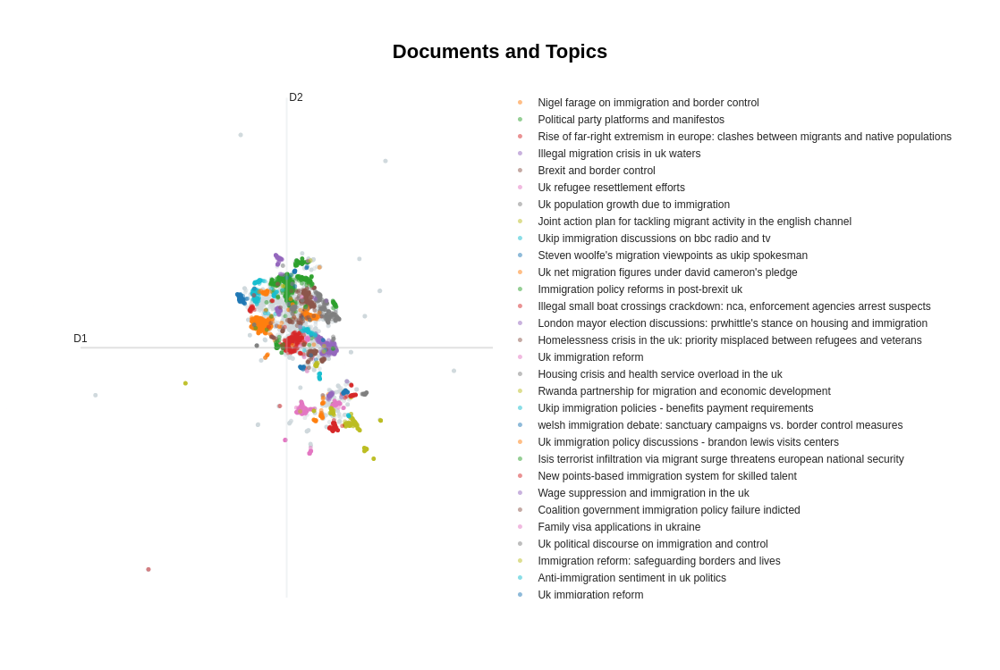

In [26]:
topic_model.visualize_documents(docs_UK, reduced_embeddings=reduced_embeddings, hide_annotations=True, hide_document_hover=False, custom_labels=True)

In [27]:
import plotly.graph_objects as go
import plotly.io as pio

# Assuming `topic_model.visualize_documents()` returns a figure object
fig = topic_model.visualize_documents(docs_UK, reduced_embeddings=reduced_embeddings, hide_annotations=True, hide_document_hover=False, custom_labels=True)

# Convert the figure to HTML
html_content = pio.to_html(fig)

# Save the HTML content to a file
with open("topic-models/UK/interactive_visualization.html", "w") as f:
    f.write(html_content)


In [28]:
import itertools
import pandas as pd

# Define colors for the visualization to iterate over
colors = itertools.cycle(['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000'])
color_key = {str(topic): next(colors) for topic in set(topic_model.topics_) if topic != -1}

# Prepare dataframe and ignore outliers
df = pd.DataFrame({"x": reduced_embeddings[:, 0], "y": reduced_embeddings[:, 1], "Topic": [str(t) for t in topic_model.topics_]})
df["Length"] = [len(doc) for doc in docs_UK]
df = df.loc[df.Topic != "-1"]
df = df.loc[(df.y > -10) & (df.y < 10) & (df.x < 10) & (df.x > -10), :]
df["Topic"] = df["Topic"].astype("category")

# Get centroids of clusters
mean_df = df.groupby("Topic").mean().reset_index()
mean_df.Topic = mean_df.Topic.astype(int)
mean_df = mean_df.sort_values("Topic")

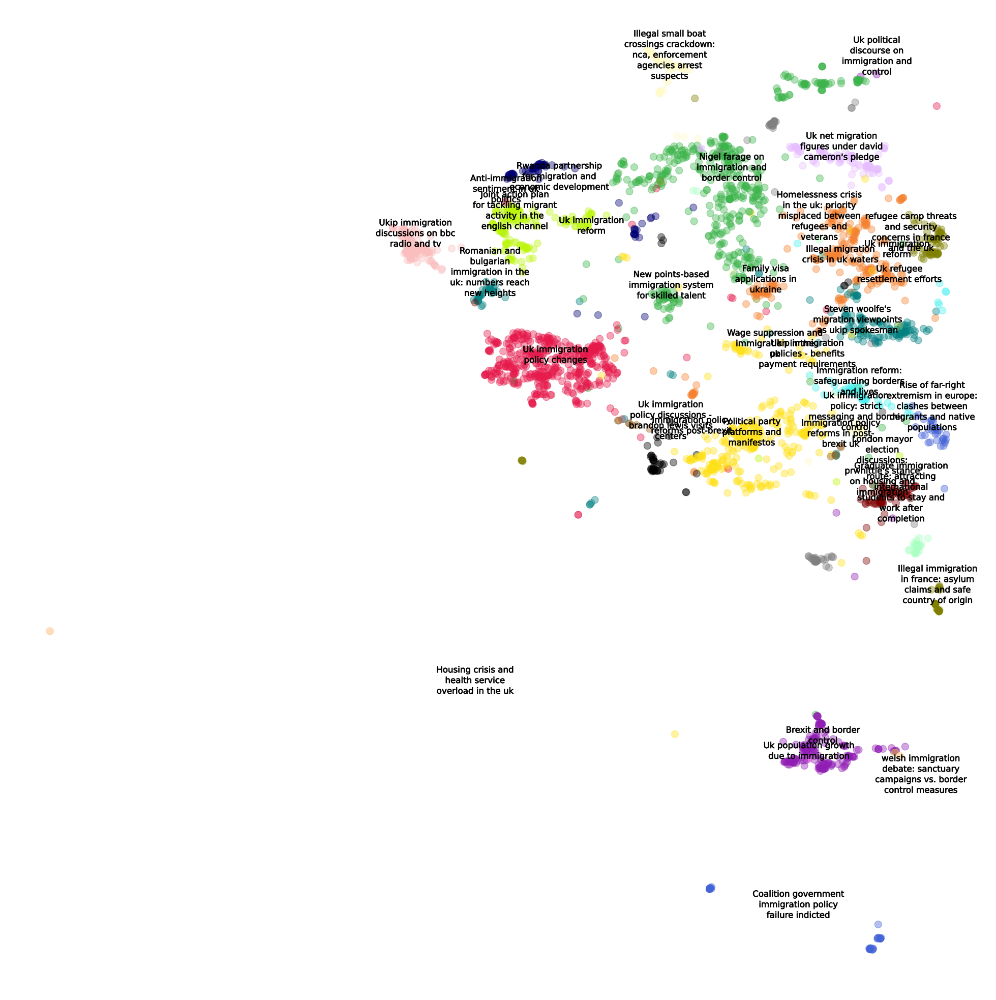

In [29]:
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import textwrap

fig, ax = plt.subplots(figsize=(20, 20))

# Scatter plot
scatter = ax.scatter(df['x'], df['y'], c=df['Topic'].map(color_key), alpha=0.4, s=100)

# Annotate top 50 topics
texts = []
for index, row in mean_df.iterrows():
    topic = row['Topic']
    name = textwrap.fill(topic_model.custom_labels_[int(topic)], 20)

    if int(topic) <= 50:
        text = ax.text(row['x'], row['y'], name, fontsize=12, ha="center", color='black',
                       path_effects=[pe.withStroke(linewidth=0.5, foreground="black")])
        texts.append(text)

# Adjust annotations
plt.tight_layout()  # Ensures tight layout
plt.axis('off')  # Turns off axis
plt.legend('', frameon=False)  # Turns off legend
plt.savefig("topic-models/UK/UK_umap15_hdb25_reducedumap10.png", dpi=300)
plt.show()

In [31]:
# add the unique topic number
df_UK['topic'] = topic_model.get_document_info(docs_UK)['Topic']

# add the topic name
df_UK['Llama2'] = topic_model.get_document_info(docs_UK)['Llama2']
# Function to extract the first item from a list, or assign a default string if list is empty or NaN
def get_first_item(x):
    try:
        return x[0] if x else None
    except TypeError:
        return "Flagged: Llama2 couldn't assign a topic name for this automatically"

# Apply the function to the 'Llama2' column
df_UK['Llama2'] = df_UK['Llama2'].apply(get_first_item)

# add the topic representation
df_UK['topic_representation'] = topic_model.get_document_info(docs_UK)['Representation'].tolist()

# add the topic probability
df_UK['topic_probability'] = topic_model.get_document_info(docs_UK)['Probability']

# add the topic representative docs
df_UK['topic_representative_docs'] = topic_model.get_document_info(docs_UK)['Representative_Docs']

# add the Top_n_words
df_UK['topic_top_n_words'] = topic_model.get_document_info(docs_UK)['Top_n_words']

# save the dataframe to a csv file
df_UK.to_csv('data/UK-R-migr-RA-twit-meta-2012-2022-with-topics.csv', index=False)

In [32]:
df_UK.head()

,data__id,data__text,data__text_without_links,data__entities__urls__unwound_url,data__lang,data__created_at,author__username,data__public_metrics__retweet_count,data__public_metrics__reply_count,data__public_metrics__like_count,data__public_metrics__quote_count,data__source,topic,Llama2,topic_representation,topic_probability,topic_representative_docs,topic_top_n_words
0,2.160884e+17,"RT @damiangreenmp: John Denham can't bring himself to admit immigration is too high. If Labour can't do that, this 'apology' is meaningless.","John Denham can't bring himself to admit immigration is too high. If Labour can't do that, this 'apology' is meaningless.",NaN,en,2012-06-22 08:41:02+00:00,@AmberRuddUK,1.0,0.0,0.0,0.0,Twitter for iPhone,-1.0,UK Immigration Policy Changes,"[you, not, more, mass, are, it, that, has, from, they]",0.000000,"[The UK’s points-based immigration system will replace freedom of movement between the UK and EU. This will change the way you hire from the EU. You will need to be a licensed sponsor to hire eligible employees from outside the UK. Find out more, The UK’s points-based immigration system will replace freedom of movement between the UK and EU. This will change the way you hire from the EU. You will need to be a licensed sponsor to hire eligible employees from outside the UK. Find out more, The UK’s points-based immigration system will replace freedom of movement between the UK and EU. This will change the way you hire from the EU. You will need to be a licensed sponsor to hire eligible employees from outside the UK. Find out more]",you - not - more - mass - are - it - that - has - from - they
1,1.922538e+17,"Just raised issue in HofC of support for Syrian refugees in Turkey, with Foreign Sec, encouraging response with financial support.","Just raised issue in HofC of support for Syrian refugees in Turkey, with Foreign Sec, encouraging response with financial support.",NaN,en,2012-04-17 14:10:49+00:00,@AmberRuddUK,0.0,0.0,0.0,0.0,Twitter for iPhone,5.0,UK Refugee Resettlement Efforts,"[refugees, vulnerable, syrian, resettlement, resettled, scheme, help, community, resettle, refugee]",0.766457,"[We’re proud of the work we've done to help thousands of refugee families like these build new lives in the UK, through government resettlement schemes.\n\nThe #BordersBill in the Houseofcommons today strengthens our commitment to help more of the world’s most vulnerable. , I'm pleased to announce over 20,000 refugees from Syria have been resettled in the UK since 2015 through our Vulnerable Persons Resettlement Scheme.\n\nAnd I can also announce £14m of support to help refugees integrate here in the UK with English language and employment support. , We've now resettled over 20,000 refugees from Syria since 2015 through the Vulnerable Persons Resettlement Scheme.\n\nThis week we announced £14m of support to help refugees integrate here in the UK with English language & employment support. ]",refugees - vulnerable - syrian - resettlement - resettled - scheme - help - community - resettle - refugee
2,2.795516e+17,We made a clear promise to the British public ... this gov would reduce and control immigration - Home Secretary http://t.co/bUuR2EFt,We made a clear promise to the British public ... this gov would reduce and control immigration - Home Secretary,https://www.gov.uk/government/speeches/home-secretary-speech-on-an-immigration-system-that-works-in-the-national-interest,en,2012-12-14 11:41:03+00:00,@ukhomeoffice,8.0,3.0,1.0,0.0,Twitter Web Client,33.0,Immigration Policy Reforms Post-Brexit,"[queensspeech, ukba, statement, secretary, bill, home, announced, measures, hs, establish]",1.000000,"[An Immigration Bill will establish new national immigration policies once we leave the EU #QueensSpeech , HS:UKBA to split into 2 organisations to improve transparency & accountability: #immigration & visas service & law enforcement organisation, Home Secretary pledged to simplify ‘complex immigration law’ – Immigration Bill will 

In [146]:
# Iterate over the dictionary and print the topics
topics_without_probs = {}

for topic_id, terms in topic_model.get_topics().items():
    if topic_id == -1:
        continue
    # Extract only the terms from each tuple
    topic_terms = [term[0] for term in terms]
    # Print the formatted output
    print(f"{topic_id}: {', '.join(topic_terms)} -> {clean_text_list(topic_model.get_topic_info()['Llama2'].tolist()[topic_id])[0]}")

    # Add to the dict
    topics_without_probs[topic_id] = topic_terms

0: farage, nigel, leader, says, lbc, bbcqt, farageonfriday, ukip, saferbritain, teamnigel -> Uk immigration policy changes
1: party, labour, only, ukip, trusted, scrap, end, vote, join, fee -> Nigel farage on immigration and border control
2: liberal, elite, liberals, europe, diversity, greatreplacement, soros, enrichment, war, refugees -> Political party platforms and manifestos
3: channel, crossed, boats, dover, patel, pritipatel, priti, boat, crossing, waters -> Rise of far-right extremism in europe: clashes between migrants and native populations
4: leave, control, borders, must, eu, inside, referendum, take, voted, back -> Illegal migration crisis in uk waters
5: refugees, vulnerable, syrian, resettlement, resettled, scheme, help, community, resettle, refugee -> Brexit and border control
6: population, 000, million, growth, year, net, crowded, numbers, jobs, born -> Uk refugee resettlement efforts
7: interior, cooperation, joint, agreement, agreed, tackle, security, signed, tackli

20it [00:01, 19.14it/s]


Mention of topics over time where Location was mentioned:


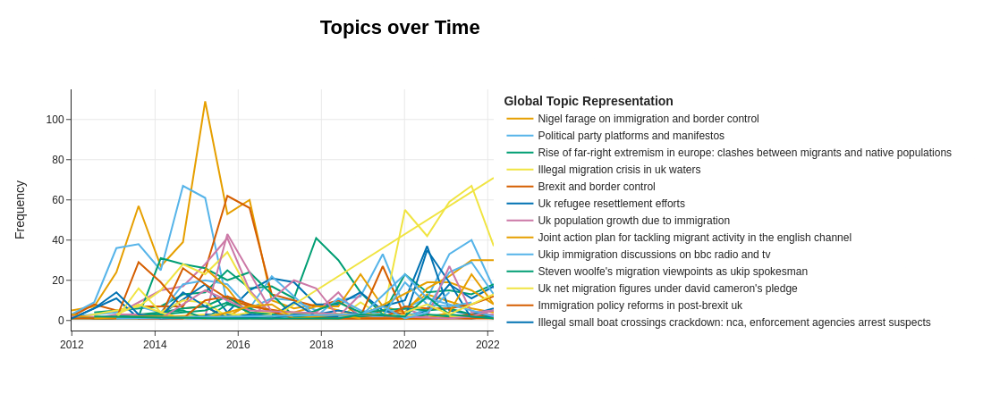

In [148]:
from datetime import datetime

# display list of topics from topic numbers
def list_topics_from_numbers(topics_to_keep):
    filtered_df = df[df['topic'].isin(topics_to_keep)]
    filtered_df = filtered_df.reset_index(drop=True)
    # display the topics
    print("The list of topics over time when country or location is mentioned:") 
    for entry in set(filtered_df['topic_name']):
        print(entry) 

# topic modeling over time based on the list of topics to keep
docs = df_UK['data__text_without_links'].to_list()

# No need to convert 'data__created_at' to strings
timestamps = df_UK['data__created_at'].to_list()

# Modeling topics over time
topics_over_time = topic_model.topics_over_time(docs_UK, timestamps, 
                                                    global_tuning=True, evolution_tuning=True, nr_bins=20)

location_topics = list(range(0, 39))
print("Mention of topics over time where Location was mentioned:")

# save larger figure
fig = topic_model.visualize_topics_over_time(topics_over_time, 
                                       topics=location_topics, 
                                       custom_labels=df_UK['Llama2'].tolist(), 
                                       width=2500, height=1000)
# Convert the figure to HTML
html_content = pio.to_html(fig)

# Save the HTML content to a file
with open("topic-models/UK/interactive_topics_over_time_all.html", "w") as f:
    f.write(html_content)

# Visualize selected topics over time
topic_model.visualize_topics_over_time(topics_over_time, 
                                       topics=location_topics, 
                                       custom_labels=df_UK['Llama2'].tolist())

In [158]:
from tqdm import tqdm
import pandas as pd

dataframe_topics_only = pd.read_csv('topic-models/UK/UK_umap15_hdb25_reducedumap10.csv')
repr_docs = dataframe_topics_only['Representative_Docs'].tolist()
topic_reprs = dataframe_topics_only['Representation'].tolist()
labels_from_llama2 = dataframe_topics_only['Llama2'].tolist()

us_them = []
flag = 0
for repr_doc, topic_repr, label_from_llama2 in tqdm(zip(repr_docs, topic_reprs, labels_from_llama2), total=len(repr_docs)):
    prompt = f"""
    Given a list of [keywords] = {topic_repr} and a [label] = {label_from_llama2} describing the keywords, 
    your task is to identify if this contains a sense of talking about the in-group(us) or the out-group (them).
    
    In-group (us): Usually having a positive feeling, these are topics that seem to focus on actions or considerations related to "us" or "we," indicating perspectives or concerns related to the UK or Britain or named entities within the UK or the speaker. 
    We uphold British cultural identity, acknowledging racial differences, while prioritizing national sovereignty, traditional values, and strict immigration policies.
    
    Out-group (them): Usually having a negative feeling, these are topics that seem to discuss actions, considerations, or situations related to "them" or others or foreigners, indicating perspectives on external entities or events.
    
    Provide your 'decision' as a "Us" or "Them" value, 'sentiment' containing the sentiment towards the referenced group, and a 'justification' explaining your reasoning. Your output should only contain the 'decision', 'sentiment', and the 'justification' in JSON.
    {'{'}
        "output": Us/Them,
        "sentiment": "positive/negative",
        "justification": "<justification goes here>"
    {'}'}
    """
    res = generator(prompt)
    us_them.append(res[0]["generated_text"][len(prompt):])
    flag += 1
    if flag == 3:
        break

  5%|████████▊                                                                                                                                                                      | 2/40 [00:14<04:32,  7.18s/it]


In [157]:
us_them

['',
 '\n    Example:\n    {\n        "output": Us,\n        "sentiment": "positive",\n        "justification": "The text mentions preserving British cultural identity and prioritizing national sovereignty, which suggests an emphasis on protecting the interests of the in-group."\n    }\n    \n    Note: The decision you make will be based solely on the content of the given text passage without considering any extraneous information such as the author\'s name or political affiliation.',
 '\nExamples:\n* If the input text mentions the keyword "UKIP" with a positive sentiment, you would return "Us".\n* If the input text mentions the keyword "Labour" with a negative sentiment, you would return "Them".\n* If the input text does not mention any of the provided keywords, you would return "N/A".']

In [159]:
import yaml

output_list = []

for item in us_them:
    if item == '':
        output_value="None"
        sentiment="None"
        justification="No in/out groups found"
    else:
        
        # Find 'output' value
        output_index = item.find('"output"')
        output_value_index = output_index + len('"output":')
        output_end_index = item.find(',', output_value_index)
        output_value = item[output_value_index:output_end_index].strip().lower()  # Extract and convert to lowercase
        if 'us' in output_value or 'we' in output_value:
            output_value = "Us"
        else:
            output_value = "Them"
    
        # Find 'sentiment' value (unchanged from previous code)
        sentiment_index = item.find('"sentiment":')
        if sentiment_index != -1:
            sentiment_start_index = sentiment_index + len('"sentiment":') + 1
            sentiment_end_index = item.find('"', sentiment_start_index + 1)  # Find the next occurrence of double quotes
            sentiment = item[sentiment_start_index:sentiment_end_index]
        else:
            sentiment = None
    
        # Find 'justification' value (unchanged from previous code)
        justification_index = item.find('"justification":')
        justification_start_index = justification_index + len('"justification":') + 1
        justification_end_index = len(item)
        justification = item[justification_start_index:justification_end_index]

    # Create dictionary and append to output list
    output_dict = {'group': output_value, 'sentiment': sentiment, 'justification': justification}
    output_list.append(output_dict)

# Print the output list
for item in output_list:
    print(item)
    print("\n")

{'group': 'None', 'sentiment': 'None', 'justification': 'No in/out groups found'}


{'group': 'Us', 'sentiment': None, 'justification': 'the input text mentions Farage saying something like "We need stricter borders to keep our country safe." you would return "Us", "positive", and "Farage advocates for tighter immigration controls to protect Britain".\n* If the input text mentions Farage saying something like "The EU needs to do more to address the migrant crisis." you would return "Them", "negative", and "Farage criticizes the EU\'s handling of the migration issue".'}


{'group': 'Them', 'sentiment': None, 'justification': 'the text mentions the keyword "UKIP" with a positive sentiment, you would return "Us".\n* If the text mentions the keyword "Labour" with a negative sentiment, you would return "Them".\n* If the text does not mention any specific political parties but instead talks about general issues such as democracy, freedom, and equality, you would return "Neutral".'}




In [151]:
# Initialize lists to store indexes of 'Us' and 'Them' groups
us = []
them = []

# Iterate through the list of dictionaries
for index, item in enumerate(output_list):
    if item['group'] == 'Us':
        us.append(index)
    elif item['group'] == 'Them':
        them.append(index)

# Subtract 1 from all values in both lists
us = [i - 1 for i in us]
them = [i - 1 for i in them]

# remove -1 from any since it's a control group
if -1 in us:
    us.remove(-1)
if -1 in them:
    them.remove(-1)

# Print the resulting lists
print("List 'us':", us)
print("List 'them':", them)

List 'us': [0, 2, 4, 6, 7, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 22, 24, 25, 27, 29, 31, 32, 34, 35, 36, 37, 38]
List 'them': [1, 3, 5, 8, 15, 20, 21, 23, 26, 28, 30, 33]


## **Preparing Embeddings for the French Tweets**

By pre-calculating the embeddings for each document, we can speed-up additional exploration steps and use the embeddings to quickly iterate over BERTopic's hyperparameters if needed.

🔥 **TIP**: You can find a great overview of good embeddings for clustering on the [MTEB Leaderboard](https://huggingface.co/spaces/mteb/leaderboard).

In [16]:
import re

# Define a function to perform the required operations on each text string
def preprocess_text(text):
    # Remove http or https or www link if present
    text = re.sub(r'https?://\S+|www\.\S+', '', text)
    # Remove "RT <str>: " or "RT <string>:" if present
    text = re.sub(r'^RT\s.*?:\s*', '', text)
    return text

# Define the data type for problem columns as 'str'
dtype_options_French = {0: 'str', 5: 'str', 6: 'str', 7: 'str', 8: 'str', 9: 'str', 10: 'str', 
                        16: 'str', 17: 'str', 18: 'str', 19: 'str', 21: 'str', 22: 'str', 
                        25: 'str', 26: 'str', 27: 'str', 31: 'str', 34: 'str', 41: 'str', 
                        42: 'str', 43: 'str'}
# Load the DataFrame from the saved CSV file
df_French = pd.read_csv('data/FR-R-MIGR-TWIT-2011-2022_meta.csv', dtype=dtype_options_French)

# Filter out non-string values in 'data__text' column
df_French = df_French[df_French['data__text'].apply(lambda x: isinstance(x, str))]

# creating a new dataframe with only the columns we want
df_French = df_French[keep_columns]

# additionally, create a new column with the data__text cleaned from URLs
df_French['data__text_without_links'] = df_French['data__text'].apply(preprocess_text)

# Convert the 'data__created_at' column to datetime with a specified format
df_French['data__created_at'] = pd.to_datetime(df_French['data__created_at'], format='%Y-%m-%dT%H:%M:%S.%fZ', errors='coerce')

# Drop rows where 'data__created_at' couldn't be parsed
df_French = df_French.dropna(subset=['data__created_at'])

# rearrange the columns to the following order
df_French = df_French[rearrange_columns]

# Remove rows where 'data__text_without_links' is NaN or an empty string
df_French = df_French.dropna(subset=['data__text_without_links'])
df_French = df_French[df_French['data__text_without_links'] != '']
df_French = df_French[df_French['data__text_without_links'] != ' ']

# load the 'data__text_without_links' from the UK dataset as docs_UK
docs_French = [html.unescape(tweet) for tweet in df_French['data__text_without_links'].tolist()]

""" for each @username or @user_name in the tweets, replace it with the string 'Username' or 'User Name'"""
def replace_at_mentions(sentence):
    # Define a regular expression pattern to match @ followed by one or more word characters
    pattern = r'@(\w+)'

    # Define a function to replace each match with its capitalized version with spaces
    def replace(match):
        return ' '.join(word.capitalize() for word in match.group(1).split('_'))

    # Use re.sub to perform the replacement
    replaced_sentence = re.sub(pattern, replace, sentence)

    return replaced_sentence

# Apply the function to each tweet in the dataset
docs_French = [replace_at_mentions(tweet) for tweet in docs_French]

In [17]:
print(docs_French[890])

Avec détermination, nos députés européens Groupeid Fr participent à faire échouer la répartition autoritaire des #migrants souhaitée par #Macron.  \n  \n Voter pour le RN, c’est UTILE et EFFICACE : la preuve ! MLP 


In [18]:
len(docs_French)

11489

In [19]:
from sentence_transformers import SentenceTransformer

# Pre-calculate embeddings
# embedding_model = SentenceTransformer("BAAI/bge-small-en") # used in example for English only
embedding_model = SentenceTransformer("intfloat/multilingual-e5-large") # <- we want this one
embeddings = embedding_model.encode(docs_French, show_progress_bar=True)

Batches:   0%|          | 0/360 [00:00<?, ?it/s]

## **Sub-models**

Next, we will define all sub-models in BERTopic and do some small tweaks to the number of clusters to be created, setting random states, etc.

In [20]:
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic.vectorizers import ClassTfidfTransformer

umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)
hdbscan_model = HDBSCAN(min_cluster_size=45, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

# ctfidf model to reduce the impact of frequent words
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

As a small bonus, we are going to reduce the embeddings we created before to 2-dimensions so that we can use them for visualization purposes when we have created our topics.

In [21]:
# Pre-reduce embeddings for visualization purposes
reduced_embeddings = UMAP(n_neighbors=15, n_components=2, min_dist=0.0, metric='cosine', random_state=42, n_jobs=1).fit_transform(embeddings)

### **Representation Models**

One of the ways we are going to represent the topics is with Llama 2 which should give us a nice label. However, we might want to have additional representations to view a topic from multiple angles.

Here, we will be using c-TF-IDF as our main representation and [KeyBERT](https://maartengr.github.io/BERTopic/getting_started/representation/representation.html#keybertinspired), [MMR](https://maartengr.github.io/BERTopic/getting_started/representation/representation.html#maximalmarginalrelevance), and [Llama 2](https://maartengr.github.io/BERTopic/getting_started/representation/llm.html) as our additional representations.

In [22]:
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, TextGeneration

# KeyBERT
keybert = KeyBERTInspired()

# MMR
mmr = MaximalMarginalRelevance(diversity=1)

# Text generation with Llama 2
llama2 = TextGeneration(generator, prompt=prompt)

# All representation models
representation_model = {
    "KeyBERT": keybert,
    "Llama2": llama2,
    "MMR": mmr,
}

# 🔥 **Training**

Now that we have our models prepared, we can start training our topic model! We supply BERTopic with the sub-models of interest, run `.fit_transform`, and see what kind of topics we get.

In [23]:
from bertopic import BERTopic

topic_model = BERTopic(

  # Sub-models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  representation_model=representation_model,
  ctfidf_model=ctfidf_model, 
  language="multilingual",
  # Hyperparameters
  top_n_words=10,
  verbose=True
)

# Train model
topics, probs = topic_model.fit_transform(docs_French, embeddings)

2024-02-07 01:23:27,923 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-02-07 01:23:36,743 - BERTopic - Dimensionality - Completed ✓
2024-02-07 01:23:36,745 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-02-07 01:23:37,337 - BERTopic - Cluster - Completed ✓
2024-02-07 01:23:37,342 - BERTopic - Representation - Extracting topics from clusters using representation models.
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37/37 [01:27<00:00,  2.38s/it]
2024-02-07 01:25:10,559 - BERTopic - Representation - Completed ✓


Now that we are done training our model, let's see what topics were generated:

In [24]:
# Show topics
topic_model.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,Llama2,MMR,Representative_Docs
0,-1,4710,-1_du_asile_dans_plus,"[du, asile, dans, plus, une, nos, pas, france, europe, que]","[immigrés, insécurité, politique, migratoire, migratoires, frontières, gouvernement, avec, toujours, depuis]","[French Political Discourse on Immigration and Borders, , , , , , , , , ]","[du, asile, dans, plus, une, nos, pas, france, europe, que]","[""""""Est-ce que les peuples ont le droit de dire """"non"""" à l'immigration, ou est-ce qu'ils n'en ont pas le droit ? C'est cela la question des #Européennes2019."""" Cnews"", « Avec nos alliés au Parlement européen, nous sommes d'ores et déjà à pied d’œuvre pour faire entendre la voix des peuples, que ce soit contre les traités de libre-échange, ou pour des frontières nationales face à la submersion migratoire qui se poursuit ! » #Punchline Cnews , ""RT Mlp Officiel: 📹 """"Il y a une grande différence entre ce qu'est la droite quand elle est candidate, avec des propos très fermes contre l'immigration, et ce qu'ils font quand ils sont au pouvoir. J'en veux pour preuve Jacques Chirac avec le regroupement familial !"""" France3tv #DimPol ]"
1,0,1024,0_marion_officiel_rt_confmlp,"[marion, officiel, rt, confmlp, mlp, npdcp, pen, legranddébat, udtfn, bourdindirect]","[lémissionpolitique, bfmpolitique, mardipolitique, élysée2017, les4vérités, clandestine, migratoire, tournéemlp, frontières, demainprésident]","[\nFrench Political Discourse on Immigration and EU Policies, , , , , , , , , ]","[marion, officiel, rt, confmlp, mlp, npdcp, pen, legranddébat, udtfn, bourdindirect]","[""RT Europe1: """"Il y a une submersion migratoire en France, car il n’y a plus de frontière intérieure dans l’Union européenne. Quand une personne arrive dans un pays de l’UE, il peut aller dans le pays qu’il veut et il fait du benchmarking"""" Mlp Officiel #LeGrandRDV , ""RT Mlp Officiel: """"En France, on installe des #migrants dans des centaines de villages. Je suis opposée à cette installation forcée, qui se fait sans l'accord des Français !"""" Cnews Europe1 #LeGrandRDV"", ""RT Mlp Officiel: """"En réalité, et nous devons l'expliquer à nos compatriotes, c'est parce que nous sommes Européens que nous sommes contre l'Union européenne, cette dictature sans visage qui organise la submersion migratoire et la disparition de nos Nations !"""" #RomorantinLanthenay #TournéeMLP ]"
2,1,586,1_bardella_onarrive_rnational_off,"[bardella, onarrive, rnational, off, européennes2019, cnews, rt, fn, possible, budget]","[européennes2019, franceinfo, européenne, macron, migratoire, votez, sudradiomatin, refuseront, doivent, bardella]","[Bardella's Migrant Crisis Discourse, , , , , , , , , ]","[bardella, onarrive, rnational, off, européennes2019, cnews, rt, fn, possible, budget]","["".J Bardella : """"Nous devons faire des prochaines élections #Européennes2019 un référendum pour ou contre la submersion migratoire ! Aujourd'hui, les peuples européens ne veulent plus de cette Union européenne passoire, qui ne les protège pas."""" #SudRadioMatin"", ""RT Rnational Off: .J Bardella : """"Avec le défi environnemental, la question migratoire est le plus grand défi du XXIème pour l'Europe. L'UE accompagne la submersion migratoire et cette ruée vers l'Europe, alors que les peuples n'en veulent plus. #8h30Politique"""""", ""RT Rnational Off: .J Bardella : """"Les #Européennes2019 doivent être aussi un référendum pour ou contre la submersion migratoire. Vous voulez continuer avec l'immigration massive ? Votez #LREM. Vous voulez des protections ? Votez pour le RN. Bfmtv""""""]"
3,2,500,2_référendum_marineprésidente_marine_mlafrance,"[référendum, marineprésidente, marine, mlafrance, pen, français, propose, choisir, je, dimanchejevotemarine]","[référendumimmigration, référendum, referendumimmigration, marineprésidente, priorité, debatmacronlepen, dimanchejevotemarine, politique, élection, présidente]","[French Political Discourse on Immigration: Referendum Proposal, , , , , , , ,

In [27]:
# Create DataFrame from topic_info dictionary
df = pd.DataFrame(topic_model.get_topic_info())
# Replace the 'Llama2' column with the first item of each list
df['Llama2'] = df['Llama2'].apply(lambda x: x[0] if isinstance(x, list) and len(x) > 0 else None)
df['Llama2'] = clean_text_list(df['Llama2'].tolist())
df['Llama2'].tolist()

['French political discourse on immigration and borders',
 'French political discourse on immigration and eu policies',
 "Bardella's migrant crisis discourse",
 'French political discourse on immigration: referendum proposal',
 'Immigration-crime link in urban areas',
 'controversial migrant debate in france: pushback efforts, economic motives, and human trafficking',
 'French migration policy debate',
 'European parliament votes on migration quotas and free trade agreements',
 'Economic efficiency through fraud reduction',
 'violence at calais jungle: police attacks and demands for expulsion',
 'Maritime human trafficking and complicity',
 'turkish aggression threatens european borders',
 'French media figures discuss immigration and asylum law',
 "France's political discourse on immigration and national sovereignty",
 'French opposition against global migration pact',
 'French political discourse on migration and terrorism',
 "Macron's immigration policies: national vs. european fron

In [28]:
# save to csv
file_path = "topic-models/French/French_umap15_hdb45_reducedumap15.csv"
topic_model.get_topic_info().to_csv(file_path, index=False)
print(f"Topic model results saved to {file_path}")

Topic model results saved to topic-models/French/French_umap15_hdb45_reducedumap15.csv


In [29]:
topic_model.get_topic(1, full=True)["KeyBERT"]

[('européennes2019', 0.8457691),
 ('franceinfo', 0.8342361),
 ('européenne', 0.8271341),
 ('macron', 0.82547504),
 ('migratoire', 0.8224741),
 ('votez', 0.8180764),
 ('sudradiomatin', 0.8180254),
 ('refuseront', 0.81629574),
 ('doivent', 0.8126618),
 ('bardella', 0.8122119)]

We got over 100 topics that were created and they all seem quite diverse.We can use the labels by Llama 2 and assign them to topics that we have created. Normally, the default topic representation would be c-TF-IDF, but we will focus on Llama 2 representations instead.

In [30]:
# llama2_labels = [label[0][0].split("\n")[0] for label in topic_model.get_topics(full=True)["Llama2"].values()]
llama2_labels = df['Llama2'].tolist()
llama2_labels[20] = llama2_labels[20][:48]
topic_model.set_topic_labels(llama2_labels)

# 📊 **Visualize**
We can go through each topic manually, which would take a lot of work, or we can visualize them all in a single interactive graph.
BERTopic has a bunch of [visualization functions](https://medium.com/r/?url=https%3A%2F%2Fmaartengr.github.io%2FBERTopic%2Fgetting_started%2Fvisualization%2Fvisualize_documents.html) that we can use. For now, we are sticking with visualizing the documents.

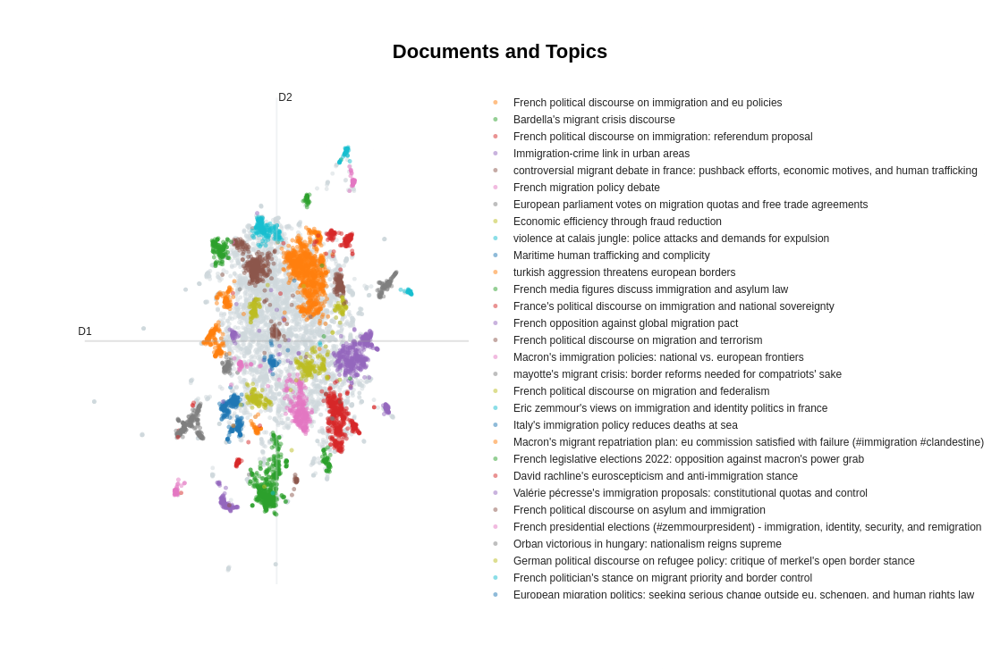

In [31]:
topic_model.visualize_documents(docs_French, reduced_embeddings=reduced_embeddings, hide_annotations=True, hide_document_hover=False, custom_labels=True)

In [32]:
import plotly.graph_objects as go
import plotly.io as pio

# Assuming `topic_model.visualize_documents()` returns a figure object
fig = topic_model.visualize_documents(docs_French, reduced_embeddings=reduced_embeddings, hide_annotations=True, hide_document_hover=False, custom_labels=True)

# Convert the figure to HTML
html_content = pio.to_html(fig)

# Save the HTML content to a file
with open("topic-models/French/interactive_visualization.html", "w") as f:
    f.write(html_content)


In [33]:
import itertools
import pandas as pd

# Define colors for the visualization to iterate over
colors = itertools.cycle(['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000'])
color_key = {str(topic): next(colors) for topic in set(topic_model.topics_) if topic != -1}

# Prepare dataframe and ignore outliers
df = pd.DataFrame({"x": reduced_embeddings[:, 0], "y": reduced_embeddings[:, 1], "Topic": [str(t) for t in topic_model.topics_]})
df["Length"] = [len(doc) for doc in docs_French]
df = df.loc[df.Topic != "-1"]
df = df.loc[(df.y > -10) & (df.y < 10) & (df.x < 10) & (df.x > -10), :]
df["Topic"] = df["Topic"].astype("category")

# Get centroids of clusters
mean_df = df.groupby("Topic").mean().reset_index()
mean_df.Topic = mean_df.Topic.astype(int)
mean_df = mean_df.sort_values("Topic")

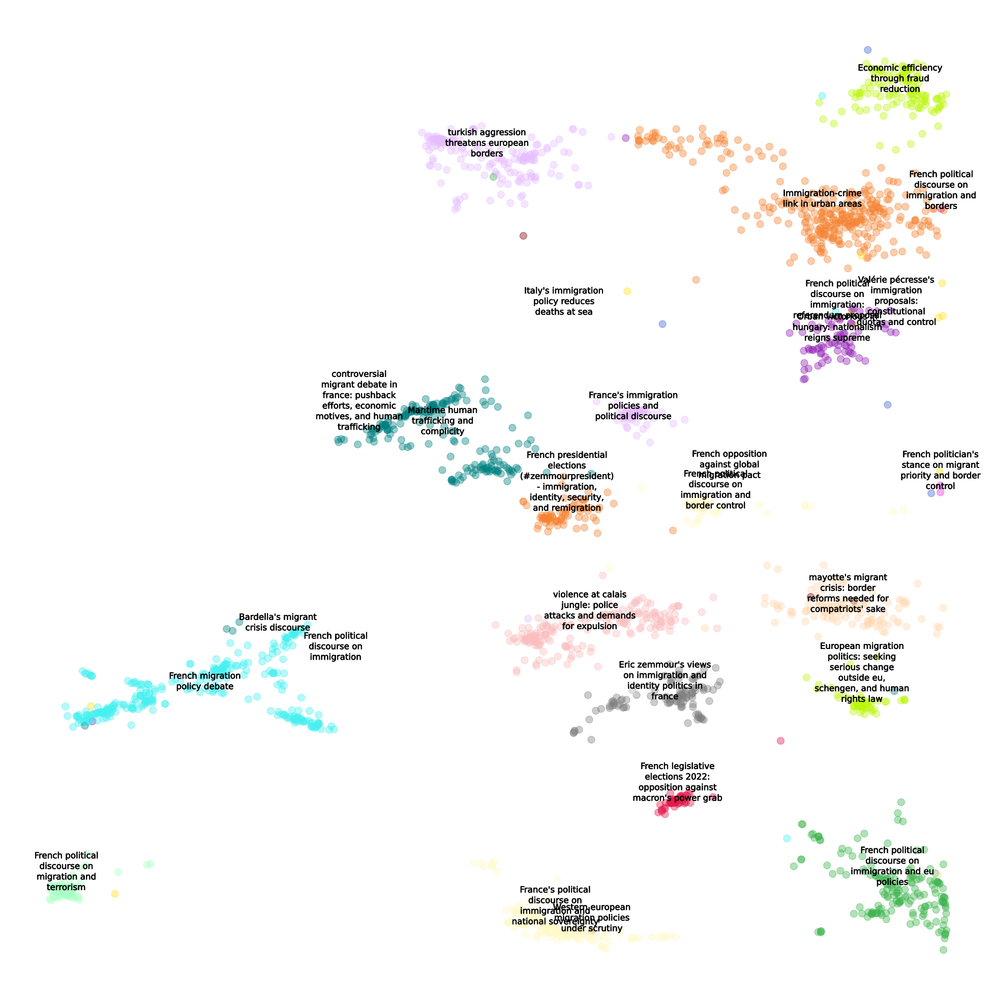

In [34]:
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import textwrap

fig, ax = plt.subplots(figsize=(20, 20))

# Scatter plot
scatter = ax.scatter(df['x'], df['y'], c=df['Topic'].map(color_key), alpha=0.4, s=100)

# Annotate top 50 topics
texts = []
for index, row in mean_df.iterrows():
    topic = row['Topic']
    name = textwrap.fill(topic_model.custom_labels_[int(topic)], 20)

    if int(topic) <= 50:
        text = ax.text(row['x'], row['y'], name, fontsize=12, ha="center", color='black',
                       path_effects=[pe.withStroke(linewidth=0.5, foreground="black")])
        texts.append(text)

# Adjust annotations
plt.tight_layout()  # Ensures tight layout
plt.axis('off')  # Turns off axis
plt.legend('', frameon=False)  # Turns off legend
plt.savefig("topic-models/French/French_umap15_hdb45_reducedumap15.png", dpi=300)
plt.show()


In [36]:
# add the unique topic number
df_French['topic'] = topic_model.get_document_info(docs_French)['Topic']

# add the topic name
df_French['Llama2'] = topic_model.get_document_info(docs_French)['Llama2']
# Function to extract the first item from a list, or assign a default string if list is empty or NaN
def get_first_item(x):
    try:
        return x[0] if x else None
    except TypeError:
        return "Flagged: Llama2 couldn't assign a topic name for this automatically"

# Apply the function to the 'Llama2' column
df_French['Llama2'] = df_French['Llama2'].apply(get_first_item)

# add the topic representation
df_French['topic_representation'] = topic_model.get_document_info(docs_French)['Representation'].tolist()

# add the topic probability
df_French['topic_probability'] = topic_model.get_document_info(docs_French)['Probability']

# add the topic representative docs
df_French['topic_representative_docs'] = topic_model.get_document_info(docs_French)['Representative_Docs']

# add the Top_n_words
df_French['topic_top_n_words'] = topic_model.get_document_info(docs_French)['Top_n_words']

# save the dataframe to a csv file
df_French.to_csv('data/FR-R-MIGR-TWIT-2011-2022_meta-with-topics.csv', index=False)

In [37]:
# Iterate over the dictionary and print the topics
topics_without_probs = {}

for topic_id, terms in topic_model.get_topics().items():
    if topic_id == -1:
        continue
    # Extract only the terms from each tuple
    topic_terms = [term[0] for term in terms]
    # Print the formatted output
    print(f"{topic_id}: {', '.join(topic_terms)} -> {clean_text_list(topic_model.get_topic_info()['Llama2'].tolist()[topic_id])[0]}")

    # Add to the dict
    topics_without_probs[topic_id] = topic_terms

0: marion, officiel, rt, confmlp, mlp, npdcp, pen, legranddébat, udtfn, bourdindirect -> French political discourse on immigration and borders
1: bardella, onarrive, rnational, off, européennes2019, cnews, rt, fn, possible, budget -> French political discourse on immigration and eu policies
2: référendum, marineprésidente, marine, mlafrance, pen, français, propose, choisir, je, dimanchejevotemarine -> Bardella's migrant crisis discourse
3: lien, délinquance, étrangers, insécurité, villeurbanne, commis, entre, violence, islamiste, anarchique -> French political discourse on immigration: referendum proposal
4: pjlétrangers, menton, cpolitique, circo0601, bcazeneuve, directpolitique, faut, radioclassique, réfugiés, crise -> Immigration-crime link in urban areas
5: record, 000, titres, macron, séjour, emmanuel, quinquennat, 500, 2021, records -> controversial migrant debate in france: pushback efforts, economic motives, and human trafficking
6: voté, lr, wauquiez, votent, laurentwauquiez, 

20it [00:01, 15.22it/s]


Mention of topics over time where Location was mentioned:


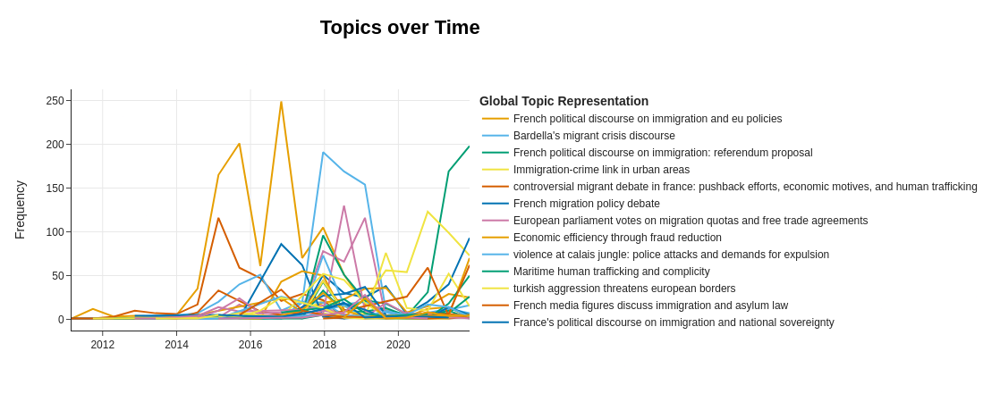

In [42]:
from datetime import datetime

# display list of topics from topic numbers
def list_topics_from_numbers(topics_to_keep):
    filtered_df = df[df['topic'].isin(topics_to_keep)]
    filtered_df = filtered_df.reset_index(drop=True)
    # display the topics
    print("The list of topics over time when country or location is mentioned:") 
    for entry in set(filtered_df['topic_name']):
        print(entry) 

# topic modeling over time based on the list of topics to keep
docs = df_French['data__text_without_links'].to_list()

# No need to convert 'data__created_at' to strings
timestamps = df_French['data__created_at'].to_list()

# Modeling topics over time
topics_over_time = topic_model.topics_over_time(docs_French, timestamps, 
                                                    global_tuning=True, evolution_tuning=True, nr_bins=20)

location_topics = list(range(0, 39))
print("Mention of topics over time where Location was mentioned:")

# save larger figure
fig = topic_model.visualize_topics_over_time(topics_over_time, 
                                       topics=location_topics, 
                                       custom_labels=df_French['Llama2'].tolist(), 
                                       width=2500, height=1000)
# Convert the figure to HTML
html_content = pio.to_html(fig)

# Save the HTML content to a file
with open("topic-models/French/interactive_topics_over_time_all.html", "w") as f:
    f.write(html_content)

# Visualize selected topics over time
topic_model.visualize_topics_over_time(topics_over_time, 
                                       topics=location_topics, 
                                       custom_labels=df_French['Llama2'].tolist())

***
***
**Repeat with GPT4**